<a href="https://colab.research.google.com/github/arsudsandesh97/arsudsandesh97/blob/main/Exploratory_Data_Analysis_Sports.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**The Sparks Foundation**

**GRIP(Graduate Rotational Internship Program) March 2023**

**Name :- Sandesh Sundarlal Arsud**

**Domain : Data Science & Business Analytics**

**Task 5 : Exploratory Data Analysis - Sports**

**Problem Statement**

* Perform ‘Exploratory Data Analysis’ on dataset ‘Indian Premier League’

* As a sports analysts, find out the most successful teams, players and factors
contributing win or loss of a team.

* Suggest teams or players a company should endorse for its products.

**Importing LIBRARIES**

In [ ]:
# Import Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt

**Importing Datasets**

In [ ]:
matches = pd.read_csv("/content/drive/MyDrive/project/Exploratory Data Analysis - Sports/matches.csv")

In [ ]:
deliveries = pd.read_csv("/content/drive/MyDrive/project/Exploratory Data Analysis - Sports/deliveries.csv")

**Checking basic information about the "Matches" dataset**

In [ ]:
matches.head()

,id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
0,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong,NaN
1,2,2017,Pune,2017-04-06,Mumbai Indians,Rising Pune Supergiant,Rising Pune Supergiant,field,normal,0,Rising Pune Supergiant,0,7,SPD Smith,Maharashtra Cricket Association Stadium,A Nand Kishore,S Ravi,NaN
2,3,2017,Rajkot,2017-04-07,Gujarat Lions,Kolkata Knight Riders,Kolkata Knight Riders,field,normal,0,Kolkata Knight Riders,0,10,CA Lynn,Saurashtra Cricket Association Stadium,Nitin Menon,CK Nandan,NaN
3,4,2017,Indore,2017-04-08,Rising Pune Supergiant,Kings XI Punjab,Kings XI Punjab,field,normal,0,Kings XI Punjab,0,6,GJ Maxwell,Holkar Cricket Stadium,AK Chaudhary,C Shamshuddin,NaN
4,5,2017,Bangalore,2017-04-08,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN


In [ ]:
matches.shape

(756, 18)

In [ ]:
matches.info

<bound method DataFrame.info of         id  season           city        date                        team1  \
0        1    2017      Hyderabad  2017-04-05          Sunrisers Hyderabad   
1        2    2017           Pune  2017-04-06               Mumbai Indians   
2        3    2017         Rajkot  2017-04-07                Gujarat Lions   
3        4    2017         Indore  2017-04-08       Rising Pune Supergiant   
4        5    2017      Bangalore  2017-04-08  Royal Challengers Bangalore   
..     ...     ...            ...         ...                          ...   
751  11347    2019         Mumbai    05/05/19        Kolkata Knight Riders   
752  11412    2019        Chennai    07/05/19          Chennai Super Kings   
753  11413    2019  Visakhapatnam    08/05/19          Sunrisers Hyderabad   
754  11414    2019  Visakhapatnam    10/05/19               Delhi Capitals   
755  11415    2019      Hyderabad    12/05/19               Mumbai Indians   

                           team

In [ ]:
matches.describe()

,id,season,dl_applied,win_by_runs,win_by_wickets
count,756.000000,756.000000,756.000000,756.000000,756.000000
mean,1792.178571,2013.444444,0.025132,13.283069,3.350529
std,3464.478148,3.366895,0.156630,23.471144,3.387963
min,1.000000,2008.000000,0.000000,0.000000,0.000000
25%,189.750000,2011.000000,0.000000,0.000000,0.000000
50%,378.500000,2013.000000,0.000000,0.000000,4.000000
75%,567.250000,2016.000000,0.000000,19.000000,6.000000
max,11415.000000,2019.000000,1.000000,146.000000,10.000000


In [ ]:
#Checking Missing Values
matches.isnull().sum()

id                   0
season               0
city                 7
date                 0
team1                0
team2                0
toss_winner          0
toss_decision        0
result               0
dl_applied           0
winner               4
win_by_runs          0
win_by_wickets       0
player_of_match      4
venue                0
umpire1              2
umpire2              2
umpire3            637
dtype: int64

In [ ]:
# Checking the dupilication in data
matches.duplicated().sum()

0

In [ ]:
# Checking Unique Values for each variable.

for i in matches.columns.tolist():
  print("No. of unique values in ",i,"is",matches[i].nunique(),".")

No. of unique values in  id is 756 .
No. of unique values in  season is 12 .
No. of unique values in  city is 32 .
No. of unique values in  date is 546 .
No. of unique values in  team1 is 15 .
No. of unique values in  team2 is 15 .
No. of unique values in  toss_winner is 15 .
No. of unique values in  toss_decision is 2 .
No. of unique values in  result is 3 .
No. of unique values in  dl_applied is 2 .
No. of unique values in  winner is 15 .
No. of unique values in  win_by_runs is 89 .
No. of unique values in  win_by_wickets is 11 .
No. of unique values in  player_of_match is 226 .
No. of unique values in  venue is 41 .
No. of unique values in  umpire1 is 61 .
No. of unique values in  umpire2 is 65 .
No. of unique values in  umpire3 is 25 .


**Checking basic information about the "Deliveries" dataset**

In [ ]:
deliveries.head()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,...,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
1,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,2,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
2,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,3,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,4,0,4,NaN,NaN,NaN
3,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,4,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
4,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,5,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,2,2,NaN,NaN,NaN


In [ ]:
deliveries.shape

(179078, 21)

In [ ]:
deliveries.info

<bound method DataFrame.info of         match_id  inning         batting_team                 bowling_team  \
0              1       1  Sunrisers Hyderabad  Royal Challengers Bangalore   
1              1       1  Sunrisers Hyderabad  Royal Challengers Bangalore   
2              1       1  Sunrisers Hyderabad  Royal Challengers Bangalore   
3              1       1  Sunrisers Hyderabad  Royal Challengers Bangalore   
4              1       1  Sunrisers Hyderabad  Royal Challengers Bangalore   
...          ...     ...                  ...                          ...   
179073     11415       2  Chennai Super Kings               Mumbai Indians   
179074     11415       2  Chennai Super Kings               Mumbai Indians   
179075     11415       2  Chennai Super Kings               Mumbai Indians   
179076     11415       2  Chennai Super Kings               Mumbai Indians   
179077     11415       2  Chennai Super Kings               Mumbai Indians   

        over  ball    batsman n

In [ ]:
deliveries.describe()

,match_id,inning,over,ball,is_super_over,wide_runs,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs
count,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000
mean,1802.252957,1.482952,10.162488,3.615587,0.000452,0.036721,0.004936,0.021136,0.004183,0.000056,1.246864,0.067032,1.313897
std,3472.322805,0.502074,5.677684,1.806966,0.021263,0.251161,0.116480,0.194908,0.070492,0.016709,1.608270,0.342553,1.605422
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,190.000000,1.000000,5.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,379.000000,1.000000,10.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
75%,567.000000,2.000000,15.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,11415.000000,5.000000,20.000000,9.000000,1.000000,5.000000,4.000000,5.000000,5.000000,5.000000,7.000000,7.000000,10.000000


**Merging The Datasets**

In [ ]:
season_df=matches[['id','season','winner']]

complete_df=deliveries.merge(season_df,how='inner',left_on='match_id',right_on='id')

**Data Visualization**

**What is the distribution of total runs scored in each match?**

In [ ]:
import plotly.express as px

fig = px.histogram(complete_df, x='total_runs', nbins=30)
fig.update_layout(
    title='Distribution of Total Runs',
    xaxis_title='Total Runs',
    yaxis_title='Frequency',
    width=800,
    height=600
)
fig.show()


**What is the distribution of runs scored by each batting team?**

In [ ]:
import plotly.express as px

fig = px.box(complete_df, x='batting_team', y='total_runs')
fig.update_layout(
    title='Distribution of Runs by Batting Team',
    xaxis_title='Batting Team',
    yaxis_title='Total Runs',
    xaxis_tickangle=-90,
    width=800,
    height=600
)
fig.show()


**Which teams have won the most number of matches?**

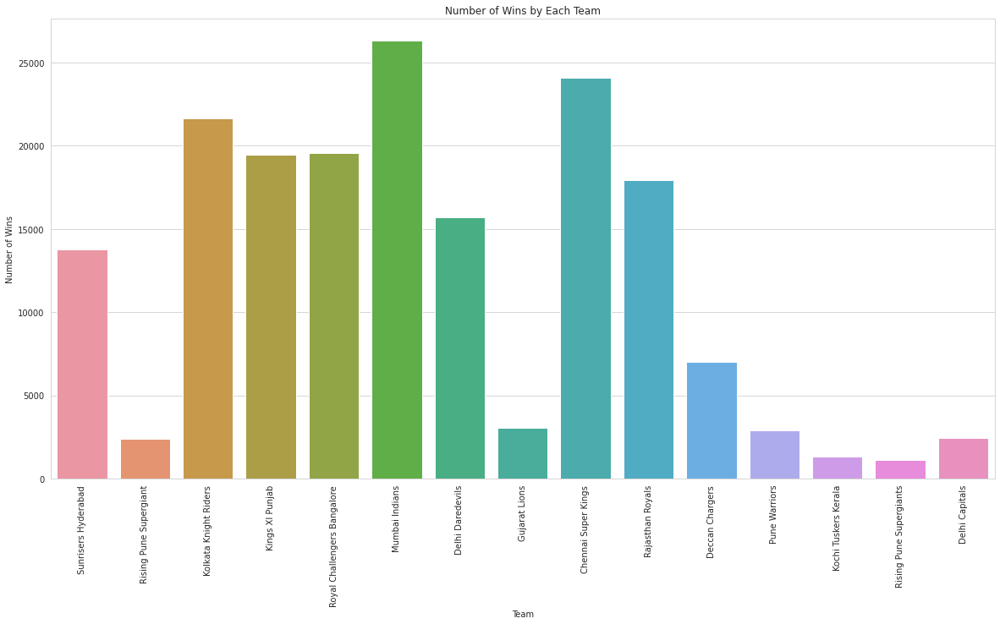

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')
plt.figure(figsize=(20, 10))
sns.countplot(x='winner', data=complete_df)
plt.title('Number of Wins by Each Team')
plt.xlabel('Team')
plt.ylabel('Number of Wins')
plt.xticks(rotation=90)
plt.show()


**What is the distribution of dismissals in each match?**

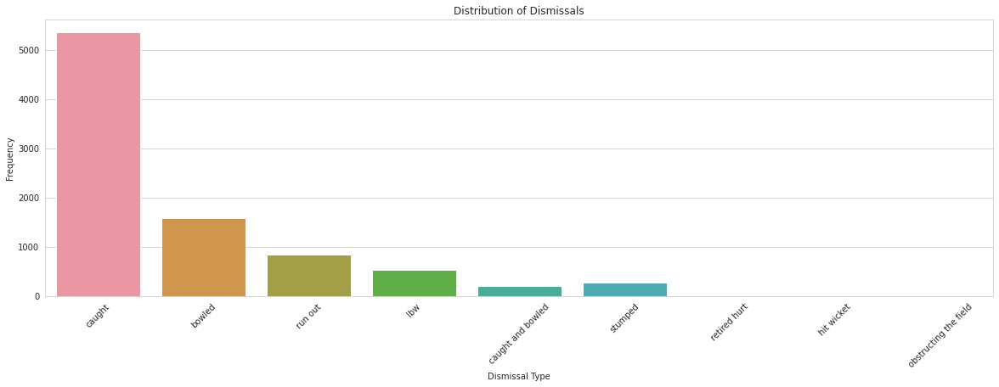

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_palette('Set2')  # set the color palette
sns.set_style('whitegrid')
plt.figure(figsize=(20, 6))
sns.countplot(x='dismissal_kind', data=complete_df)
plt.title('Distribution of Dismissals')
plt.xlabel('Dismissal Type')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()


**What is the distribution of extra runs given by each bowling team?**

In [ ]:
import plotly.express as px

fig = px.box(complete_df, x='bowling_team', y='extra_runs', title='Distribution of Extra Runs by Bowling Team')
fig.show()


**What is the distribution of individual player scores?**

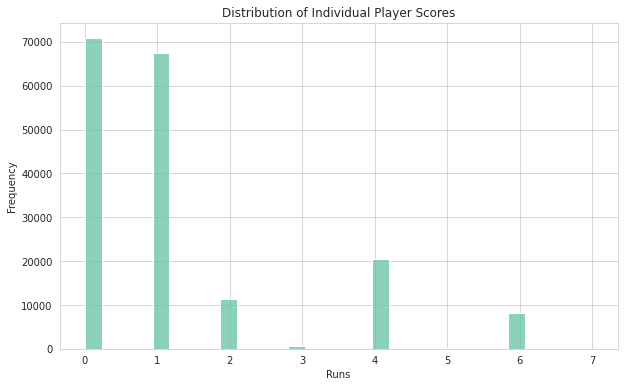

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')
plt.figure(figsize=(10, 6))
sns.histplot(complete_df['batsman_runs'], bins=30)
plt.title('Distribution of Individual Player Scores')
plt.xlabel('Runs')
plt.ylabel('Frequency')
plt.show()


In [ ]:
import plotly.express as px

fig = px.histogram(complete_df, x='batsman_runs', nbins=30, labels={'batsman_runs': 'Runs', 'count': 'Frequency'})
fig.update_layout(title='Distribution of Individual Player Scores', xaxis_title='Runs', yaxis_title='Frequency', width=800, height=500)
fig.show()


**What is the distribution of wickets taken by each bowling team?**

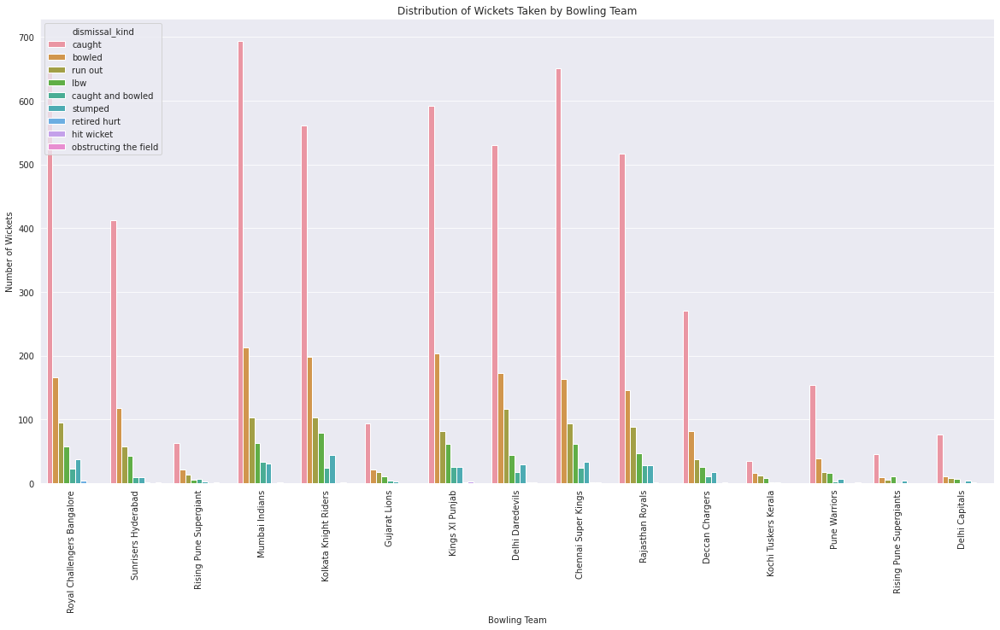

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('darkgrid')
plt.figure(figsize=(20, 10))
sns.countplot(x='bowling_team', hue='dismissal_kind', data=complete_df)
plt.title('Distribution of Wickets Taken by Bowling Team')
plt.xlabel('Bowling Team')
plt.ylabel('Number of Wickets')
plt.xticks(rotation=90)
plt.show()


**How does the average total runs scored per match change over the seasons?**

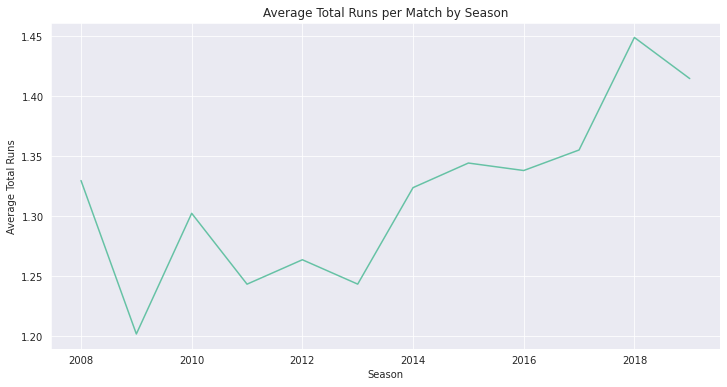

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(complete_df.groupby('season').mean().reset_index()['season'], complete_df.groupby('season').mean().reset_index()['total_runs'])
plt.title('Average Total Runs per Match by Season')
plt.xlabel('Season')
plt.ylabel('Average Total Runs')
plt.show()


**How does the number of matches played by each team change over the seasons?**

In [ ]:
complete_df

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,...,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder,id,season,winner,run_rate
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,NaN,NaN,NaN,1,2017,Sunrisers Hyderabad,0.00
1,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,2,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,NaN,NaN,NaN,1,2017,Sunrisers Hyderabad,0.00
2,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,3,DA Warner,S Dhawan,TS Mills,0,...,4,0,4,NaN,NaN,NaN,1,2017,Sunrisers Hyderabad,4.00
3,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,4,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,NaN,NaN,NaN,1,2017,Sunrisers Hyderabad,0.00
4,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,5,DA Warner,S Dhawan,TS Mills,0,...,0,2,2,NaN,NaN,NaN,1,2017,Sunrisers Hyderabad,2.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179073,11415,2,Chennai Super Kings,Mumbai Indians,20,2,RA Jadeja,SR Watson,SL Malinga,0,...,1,0,1,NaN,NaN,NaN,11415,2019,Mumbai Indians,0.05
179074,11415,2,Chennai Super Kings,Mumbai Indians,20,3,SR Watson,RA Jadeja,SL Malinga,0,...,2,0,2,NaN,NaN,NaN,11415,2019,Mumbai Indians,0.10
179075,11415,2,Chennai Super Kings,Mumbai Indians,20,4,SR Watson,RA Jadeja,SL Malinga,0,...,1,0,1,SR Watson,run out,KH Pandya,11415,2019,Mumbai Indians,0.05
179076,11415,2,Chennai Super Kings,Mumbai Indians,20,5,SN Thakur,RA Jadeja,SL Malinga,0,...,2,0,2,NaN,NaN,NaN,11415,2019,Mumbai Indians,0.10
